# Berlin Airbnb Data

## Business Understanding

I chose to analyse the [Berlin Airbnb dataset](http://insideairbnb.com/get-the-data.html) provided by Kaggle, using the `listings` and `calendar` files, and approach it from the three following angles.

1. What is the most expensive neighbourhood in Berlin ? Can seasonal effects be identified, and how are prices likely to behave in each neighbourhood in the following weeks ?

    The output of this investigation will be a trend chart, featuring the average listing price by neighbourhood.

2. How is offer distributed across the city ? Does this distribution match that of customer satisfaction ? In other words, how strongly does the neighbourhood influence customer satisfaction ?

    The output of this investigation will a map, displaying appartments by neighbourhood, segmented by the rating they received.

3. What is the best predictor of a good review ?

    I will compare the importance of eight variables, some numeric and some categorical, on the rating received by an appartment, using a random forest. The output will be a bar chart of these relative importances.

## Data Understanding

Let's gather the data we'll need for the analysis.

In [35]:
# Install packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel
import seaborn as sns
import datetime
from datetime import date
from keplergl import KeplerGl
from operator import itemgetter
%matplotlib inline

In [36]:
# Upload calendar dataset
calendar = pd.read_csv('calendar.csv')
calendar.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,1944,2019-11-14,f,$20.00,$20.00,60,120
1,1944,2019-11-15,f,$20.00,$20.00,60,120
2,1944,2019-11-16,f,$20.00,$20.00,60,120
3,1944,2019-11-17,f,$20.00,$20.00,60,120
4,1944,2019-11-18,f,$20.00,$20.00,60,120


In [37]:
# Upload listings dataset
listings = pd.read_csv('listings.csv')
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,1944,https://www.airbnb.com/rooms/1944,20191112224519,2019-11-14,cafeheaven Pberg/Mitte,"Private, bright and friendly room. You'd be sh...","The room is very large, private, cozy, bright,...","Private, bright and friendly room. You'd be sh...",none,near all the trendy cafés and flea markets and...,...,f,f,moderate,f,f,1,0,1,0,0.24
1,3176,https://www.airbnb.com/rooms/3176,20191112224519,2019-11-14,Fabulous Flat in great Location,This beautiful first floor apartment is situa...,1st floor (68m2) apartment on Kollwitzplatz/ P...,This beautiful first floor apartment is situa...,none,The neighbourhood is famous for its variety of...,...,f,f,strict_14_with_grace_period,f,f,1,1,0,0,1.14
2,3309,https://www.airbnb.com/rooms/3309,20191112224519,2019-11-14,BerlinSpot Schöneberg near KaDeWe,First of all: I prefer short-notice bookings. ...,"Your room is really big and has 26 sqm, is ver...",First of all: I prefer short-notice bookings. ...,none,"My flat is in the middle of West-Berlin, direc...",...,f,f,strict_14_with_grace_period,f,f,1,0,1,0,0.35
3,6883,https://www.airbnb.com/rooms/6883,20191112224519,2019-11-14,Stylish East Side Loft in Center with AC & 2 b...,NaN,Stay in a stylish loft on the second floor and...,Stay in a stylish loft on the second floor and...,none,The emerging and upcoming East of the new hip ...,...,f,f,moderate,f,t,1,1,0,0,1.08
4,7071,https://www.airbnb.com/rooms/7071,20191112224519,2019-11-14,BrightRoom with sunny greenview!,Cozy and large room in the beautiful district ...,"The BrightRoom is an approx. 20 sqm (215ft²), ...",Cozy and large room in the beautiful district ...,none,"Great neighborhood with plenty of Cafés, Baker...",...,f,f,moderate,f,f,2,0,2,0,2.13


## Prepare Data

### General Preparation

These preparatory steps are necessary for any further data manipulation. They are not specific to an analysis topic.

#### Listings dataset

We will start by reducing the size of the *listings* dataset, which is now too big to be properly explored, and contains unnecessary data.

In [38]:
# Create a list of columns which I want to keep in the listings dataset
columns_to_keep = ['id', 'summary', 'space', 'description', 'neighborhood_overview', 'host_id', 'host_since',
'host_location', 'host_response_time', 'host_acceptance_rate', 'host_is_superhost', 'neighbourhood', 'host_listings_count',
'host_total_listings_count', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude', 'longitude',
'property_type', 'room_type', 'accommodates', 'bed_type', 'amenities', 'square_feet', 'price', 'weekly_price',
'monthly_price', 'minimum_nights', 'maximum_nights', 'number_of_reviews', 'first_review',  'last_review',
'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_location',
'review_scores_value', 'reviews_per_month']

In [39]:
# Keep only relevant data from the listings dataset
listings = listings[columns_to_keep]

We will now check for duplicates and missing data.

In [40]:
# Check for missing data in the listings dataset
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24586 entries, 0 to 24585
Data columns (total 38 columns):
id                              24586 non-null int64
summary                         23373 non-null object
space                           15961 non-null object
description                     24162 non-null object
neighborhood_overview           13751 non-null object
host_id                         24586 non-null int64
host_since                      24558 non-null object
host_location                   24471 non-null object
host_response_time              13825 non-null object
host_acceptance_rate            0 non-null float64
host_is_superhost               24558 non-null object
neighbourhood                   24515 non-null object
host_listings_count             24558 non-null float64
host_total_listings_count       24558 non-null float64
neighbourhood_cleansed          24586 non-null object
neighbourhood_group_cleansed    24586 non-null object
latitude                      

In [41]:
# Check proportion of missing values in columns `weekly_price`and `monthly_price` of the listings dataset
missing_weekly = round((listings['weekly_price'].isna().sum() / listings.shape[0]) * 100, 1)
missing_monthly = round((listings['monthly_price'].isna().sum() / listings.shape[0]) * 100, 1)
print("The column `weekly_price` has {} % of its values missing, while the column `monthly_price` misses {} % of its values.".format(missing_weekly,missing_monthly))

The column `weekly_price` has 87.2 % of its values missing, while the column `monthly_price` misses 90.8 % of its values.


In [42]:
# Check accuracy of values in column `square_feet`
listings['square_feet'].value_counts()

0.0       115
646.0      16
753.0      13
431.0      12
592.0      11
         ... 
65.0        1
1012.0      1
450.0       1
560.0       1
46.0        1
Name: square_feet, Length: 110, dtype: int64

In the listings dataset, the column `host_acceptance_rate` has no value and should therefore be removed.

The columns `weekly_price` and `monthly_price` have a significant amount of missing values. Besides, they are partly redundant in the dataset, as we already have the column `price` at our disposal. Both will therefore be deleted.

Finally, the column `square_feet` also has very few values to show and most of these values are 0, which is inaccurate. This column will be removed too.

In [43]:
# Check for duplicates in the listings dataset
listings.duplicated().sum()

0

There are no duplicates to handle.

In [44]:
# Check general accuracy of data
listings.describe()

,id,host_id,host_acceptance_rate,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,square_feet,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_location,review_scores_value,reviews_per_month
count,2.458600e+04,2.458600e+04,0.0,24558.000000,24558.000000,24586.000000,24586.000000,24586.000000,429.000000,24586.000000,24586.000000,24586.000000,20035.000000,20009.000000,20012.000000,19992.000000,19989.000000,20505.000000
mean,2.032621e+07,7.157526e+07,NaN,3.289763,3.289763,52.510135,13.405700,2.678964,497.328671,7.265436,599.071829,21.305458,94.629798,9.684592,9.334399,9.593037,9.410326,1.124612
std,1.154622e+07,8.019021e+07,NaN,29.712178,29.712178,0.031351,0.059172,1.566752,519.394221,28.363899,633.189630,44.508515,7.597699,0.736754,1.026027,0.728482,0.848326,1.558517
min,1.944000e+03,2.058000e+03,NaN,0.000000,0.000000,52.345800,13.097180,1.000000,0.000000,1.000000,1.000000,0.000000,20.000000,2.000000,2.000000,2.000000,2.000000,0.010000
25%,1.018156e+07,1.063757e+07,NaN,1.000000,1.000000,52.489260,13.374753,2.000000,0.000000,2.000000,20.000000,1.000000,92.000000,10.000000,9.000000,9.000000,9.000000,0.150000
50%,2.049361e+07,3.795708e+07,NaN,1.000000,1.000000,52.509520,13.416305,2.000000,431.000000,3.000000,1098.500000,5.000000,97.000000,10.000000,10.000000,10.000000,10.000000,0.500000
75%,3.030221e+07,1.098736e+08,NaN,2.000000,2.000000,52.532850,13.439530,3.000000,753.000000,4.000000,1125.000000,19.000000,100.000000,10.000000,10.000000,10.000000,10.000000,1.470000
max,4.008630e+07,3.089376e+08,NaN,1492.000000,1492.000000,52.656630,13.758420,16.000000,4639.000000,1124.000000,50000.000000,596.000000,100.000000,10.000000,10.000000,10.000000,10.000000,36.350000


It appears that the column `host_total_lisings_count` is a duplicate of `host_listings_count`. We need not keep it.

In [45]:
# Remove all unnecessary columns
listings_full = listings.drop(['host_acceptance_rate', 'weekly_price', 'monthly_price', 'square_feet', 'host_total_listings_count'], axis=1)

In [46]:
# Test change
listings_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24586 entries, 0 to 24585
Data columns (total 33 columns):
id                              24586 non-null int64
summary                         23373 non-null object
space                           15961 non-null object
description                     24162 non-null object
neighborhood_overview           13751 non-null object
host_id                         24586 non-null int64
host_since                      24558 non-null object
host_location                   24471 non-null object
host_response_time              13825 non-null object
host_is_superhost               24558 non-null object
neighbourhood                   24515 non-null object
host_listings_count             24558 non-null float64
neighbourhood_cleansed          24586 non-null object
neighbourhood_group_cleansed    24586 non-null object
latitude                        24586 non-null float64
longitude                       24586 non-null float64
property_type             

The remaining missing values will be dealt with topic by topic.

#### Calendar dataset

In [47]:
# Check for missing data in the calendar dataset
calendar.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8973890 entries, 0 to 8973889
Data columns (total 7 columns):
listing_id        8973890 non-null int64
date              8973890 non-null object
available         8973890 non-null object
price             8972965 non-null object
adjusted_price    8972965 non-null object
minimum_nights    8973890 non-null int64
maximum_nights    8973890 non-null int64
dtypes: int64(3), object(4)
memory usage: 479.3+ MB


Two things appear : some columns do not have the right data type, and price, which is a critical field for the analysis, has missing data, although the number of null values is overall very low.

We will start by changing the data type where needed. The missing values will be handled further along the way, when the dataset needed for the predictive analysis has been created.

In order to change the data type of the columns `price` and `adjusted_price`, the dollar sign needs to be removed from the cells.

In [48]:
# Remove dollar sign using regular expression
def remove_dollar(dataframe, column_name):
    '''
    This function removes the dollar sign from a string, and perform conversion to float type.
    Argument :
    column_name = name of column of type object and containing dollar sign
    dataframe = dataframe to which this column belongs
    Output : 
    dataframe = dataframe where column has been stripped of its dollar sign and converted to float type
    '''
    dataframe[column_name] =  dataframe[column_name].str.extract(r'(\d+[.]\d+)')
    dataframe[column_name]= dataframe[column_name].astype(float) 
    return dataframe

In [49]:
# Apply function to calendar dataset
remove_dollar(calendar, 'price')
remove_dollar(calendar, 'adjusted_price')
calendar_corr = calendar

In [50]:
# Test changes
calendar_corr.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8973890 entries, 0 to 8973889
Data columns (total 7 columns):
listing_id        8973890 non-null int64
date              8973890 non-null object
available         8973890 non-null object
price             8972965 non-null float64
adjusted_price    8972965 non-null float64
minimum_nights    8973890 non-null int64
maximum_nights    8973890 non-null int64
dtypes: float64(2), int64(3), object(2)
memory usage: 479.3+ MB


In [51]:
# Check for duplicates in the calendar dataset
calendar_corr.duplicated().sum()

0

In [52]:
# Check accuracy of data
calendar_corr.describe()

,listing_id,price,adjusted_price,minimum_nights,maximum_nights
count,8.973890e+06,8.972965e+06,8.972965e+06,8.973890e+06,8.973890e+06
mean,2.032621e+07,6.685748e+01,6.682528e+01,7.347628e+00,6.119046e+02
std,1.154598e+07,6.226252e+01,6.223188e+01,2.844107e+01,6.683694e+02
min,1.944000e+03,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
25%,1.018153e+07,3.500000e+01,3.500000e+01,2.000000e+00,2.100000e+01
50%,2.049361e+07,5.000000e+01,5.000000e+01,3.000000e+00,1.124000e+03
75%,3.030226e+07,8.000000e+01,8.000000e+01,4.000000e+00,1.125000e+03
max,4.008630e+07,9.990000e+02,9.990000e+02,1.124000e+03,5.000000e+04


From what the statistics show, there is no difference between the price and the adjusted price. We will therefore remove the column `adjusted_price`.

In [53]:
# Drop redundant column `adjusted_price`
calendar_final = calendar_corr.drop(['adjusted_price'], axis=1)

### Preparation - Question 1

We will here apply the changes needed to answer the first of our three questions.

We want to find out what the most expensive neighbourhood in Berlin is and has been over the past few years. We also want to predict the prices in the most expensive neighbourhood for the next quarter.

For this, we will need to build a dataset where the price of a listing is assigned to a date and to a neighbourhood. We won't need anything more than these three variables.

We will start by joining the column `neighbourhood` from the listings dataframe to the calendar dataframe, using `listing_id` as a primary key. We will eventually be using the calendar dataframe for the analysis.

In [54]:
# Select columns to join (or join on) from the listings dataset
df_to_join = listings_full[['id', 'neighbourhood_group_cleansed']]

In [55]:
# Rename id column for more clarity
df_to_join.rename(columns={'id': 'listing_id'}, inplace=True)

In [56]:
# Join columns to calendar dataset
prices = calendar_final.set_index('listing_id').join(other=df_to_join.set_index('listing_id')).reset_index()

In [57]:
# Rename column for better readability
prices.rename(columns={'neighbourhood_group_cleansed' : 'neighbourhood'}, inplace=True)

In [58]:
# Remove unnecessary columns
prices.drop(['minimum_nights', 'maximum_nights'], axis=1, inplace=True)

In [59]:
# Select only prices when the appartment was available
prices_final = prices.query('available == "t"')

We will now deal with missing values.

In [60]:
# Check number of null values 
prices_final.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1794232 entries, 21 to 8973550
Data columns (total 5 columns):
listing_id       1794232 non-null int64
date             1794232 non-null object
available        1794232 non-null object
price            1794210 non-null float64
neighbourhood    1794232 non-null object
dtypes: float64(1), int64(1), object(3)
memory usage: 82.1+ MB


The column `price` only has missing data. This is the value we want to predict.

In [61]:
# View rows containing null values
prices_final.query('price.isna() == True')

,listing_id,date,available,price,neighbourhood
8207013,37135857,2020-11-01,t,NaN,Mitte
8207014,37135857,2020-11-02,t,NaN,Mitte
8207015,37135857,2020-11-03,t,NaN,Mitte
8207016,37135857,2020-11-04,t,NaN,Mitte
8207017,37135857,2020-11-05,t,NaN,Mitte
8207018,37135857,2020-11-06,t,NaN,Mitte
8207019,37135857,2020-11-07,t,NaN,Mitte
8207020,37135857,2020-11-08,t,NaN,Mitte
8207021,37135857,2020-11-09,t,NaN,Mitte
8207022,37135857,2020-11-10,t,NaN,Mitte


To fill the empty cells, we will impute the mean of the column, where the rows share the same listing id.

In [62]:
# Create list of tuples containing the average price by listing id
unique_ids = list(prices_final['listing_id'].unique())    

In [63]:
# Create a dataframe containing average price for each listing
avg_prices = prices_final.groupby(['listing_id']).mean()['price'].reset_index().rename(columns={'price' : 'mean_price'})

In [64]:
# Join mean price to prices_final
prices_enr = prices_final.set_index('listing_id').join(other=avg_prices.set_index('listing_id')).reset_index()

In [65]:
# Fill empty price with average price (takes between 2 and 3 minutes to run)
for index, row in prices_enr.iterrows():
    if pd.isnull(prices_enr.loc[index, 'price']) == True:
        prices_enr.loc[index, 'price'] = prices_enr.loc[index, 'mean_price']

In [66]:
# Test results
prices_enr.query('listing_id == 37135857 & date == "2020-11-01"')

,listing_id,date,available,price,neighbourhood,mean_price
1614017,37135857,2020-11-01,t,246.41369,Mitte,246.41369


In [67]:
# Test results
prices_enr.query('listing_id == 38740123 & date == "2019-12-15"')

,listing_id,date,available,price,neighbourhood,mean_price
1700397,38740123,2019-12-15,t,NaN,Mitte,NaN


We noticed that some dates go beyond the current date. We will remove these rows as we will want to forecast prices.

In [68]:
# Remove rows where date > current date
today = date.today()
prices_enr = prices_enr[pd.to_datetime(prices_enr['date']) <= today]

/Users/mahaut/.pyenv/versions/3.7.5/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Comparing Series of datetimes with 'datetime.date'.  Currently, the
'datetime.date' is coerced to a datetime. In the future pandas will
not coerce, and a TypeError will be raised. To retain the current
behavior, convert the 'datetime.date' to a datetime with
'pd.Timestamp'.
  This is separate from the ipykernel package so we can avoid doing imports until


In [69]:
prices_final = prices_enr

### Preparation - Question 2

To answer question 2, we need to find out how customer satisfaction and offer of appartments are distributed across the city, and whether they follow a similar pattern.

This will allow us to compare the behaviour of hosts / appartment owners with that of visitors, and determine whether they match.

For this purpose, we will build a dataset containing information related to customer satisfaction (review scores), number of hosts and number of listings, by neighbourhood.
As the visualisation will be a map, we also need geographical data, in our case latitude and longitude.

We will be using the listings dataset only.

In [70]:
listings_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24586 entries, 0 to 24585
Data columns (total 33 columns):
id                              24586 non-null int64
summary                         23373 non-null object
space                           15961 non-null object
description                     24162 non-null object
neighborhood_overview           13751 non-null object
host_id                         24586 non-null int64
host_since                      24558 non-null object
host_location                   24471 non-null object
host_response_time              13825 non-null object
host_is_superhost               24558 non-null object
neighbourhood                   24515 non-null object
host_listings_count             24558 non-null float64
neighbourhood_cleansed          24586 non-null object
neighbourhood_group_cleansed    24586 non-null object
latitude                        24586 non-null float64
longitude                       24586 non-null float64
property_type             

In [71]:
# Get rid of unnecessary columns
listings_trimmed = listings_full[['id', 'host_id', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 'review_scores_rating']]

In [72]:
# Rename columns for readability
listings_trimmed.rename(columns={'id': 'listing_id', 'neighbourhood_group_cleansed' : 'neighbourhood', 'review_scores_rating' : 'rating'}, inplace=True)

In [73]:
# Drop rows where rating is null
listings_map = listings_trimmed[np.isfinite(listings_trimmed['rating'])]

In [74]:
# Test results
listings_map.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20035 entries, 0 to 24471
Data columns (total 6 columns):
listing_id       20035 non-null int64
host_id          20035 non-null int64
neighbourhood    20035 non-null object
latitude         20035 non-null float64
longitude        20035 non-null float64
rating           20035 non-null float64
dtypes: float64(3), int64(2), object(1)
memory usage: 1.1+ MB


### Preparation - Question 3

In question 3, we will attempt to determine the best predictor of a good review, between the following variables :
- seniority of host on platform (num), 
- price (num), 
- rating (num),
- host response time (cat),
- whether wifi is available (cat), 
- whether pets are allowed (cat), 
- bed type (cat),
- property type (cat)

We will not consider whether the host is or is not a superhost, as this variable is collinear with seniority and response time. To become a superhost, a host needs to have had a significant experience on the platform and a response rate of 90% ("superhosts respond to 90% of new messages within 24 hours"). Besides, the label "superhost" is also based on the ratings received by an individual, meaning that superhosts will necessarily have better ratings than the average host, which introduces a bias in the results. 

As we have a majority of categorical variables, we will resort to a random forest.

We will be using the listings dataset exclusively.

In [103]:
# Trim dataset
score_predictor = listings_full[['host_since', 'price', 'review_scores_rating', 'host_response_time', 'amenities', 'bed_type', 'property_type']]

In [104]:
score_predictor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24586 entries, 0 to 24585
Data columns (total 7 columns):
host_since              24558 non-null object
price                   24586 non-null object
review_scores_rating    20035 non-null float64
host_response_time      13825 non-null object
amenities               24586 non-null object
bed_type                24586 non-null object
property_type           24586 non-null object
dtypes: float64(1), object(6)
memory usage: 1.3+ MB


In [105]:
# Remove all rows containg missing data
score_predictor.dropna(inplace=True)

/Users/mahaut/.pyenv/versions/3.7.5/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [106]:
score_predictor.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12302 entries, 0 to 24471
Data columns (total 7 columns):
host_since              12302 non-null object
price                   12302 non-null object
review_scores_rating    12302 non-null float64
host_response_time      12302 non-null object
amenities               12302 non-null object
bed_type                12302 non-null object
property_type           12302 non-null object
dtypes: float64(1), object(6)
memory usage: 768.9+ KB


The columns `host_since` and `price` are not set to the correct data type.

In [107]:
# Change data type of `host_since` by counting the number of days separating the date at which the host started
# on the platform and the current date
current_datetime = datetime.datetime.now()
host_seniority = []
for x in score_predictor['host_since']:
    host_seniority.append((current_datetime - pd.to_datetime(x)).days)

In [108]:
# Add new column to score_predictor with host seniority data
score_predictor['host_seniority'] = host_seniority

/Users/mahaut/.pyenv/versions/3.7.5/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [109]:
# Remove host_since from dataset
score_pred_2 = score_predictor.drop(['host_since'], axis=1)

In [110]:
# Convert `price` to a numeric value by removing the $ sign (resorting to method used above)
remove_dollar(score_pred_2, 'price')
score_pred_3 = score_pred_2

In [111]:
# Test change
score_pred_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12302 entries, 0 to 24471
Data columns (total 7 columns):
price                   12302 non-null float64
review_scores_rating    12302 non-null float64
host_response_time      12302 non-null object
amenities               12302 non-null object
bed_type                12302 non-null object
property_type           12302 non-null object
host_seniority          12302 non-null int64
dtypes: float64(2), int64(1), object(4)
memory usage: 768.9+ KB


The `amenities` column contains information concerning wifi and pets. We will turn the `amenities` column into two columns, indicating whether internet is provided, and whether pets are allowed.

In [112]:
# Create bool column `has_wifi` based on tag "Wifi" in amenities. 
# Keep capitalization as "wifi" might be preceded by "No".
score_pred_3['has_wifi'] = score_pred_3['amenities'].str.contains(r'(Wifi)').values

In [113]:
# Create bool column `pets_allowed` based on tag "Pets allowed" in amenities. 
score_pred_3['pets_allowed'] = score_pred_3['amenities'].str.contains(r'(Pets allowed)').values

In [114]:
# Remove column `amenities`
score_pred_4 = score_pred_3.drop(['amenities'], axis=1)

In [116]:
# Encode all boolean columns to 1 and 0
score_pred_4[['pets_allowed', 'has_wifi']] = score_pred_4[['pets_allowed', 'has_wifi']].astype(int)

In [117]:
# Rename for readability
score_pred_4.rename(columns={'review_scores_rating': 'rating'}, inplace=True)

In [118]:
# Create dummy variables to encode categorical variables, dropping one redundant dummy column each time
dummy_vars = pd.get_dummies(score_pred_4[['host_response_time', 'bed_type', 'property_type']], drop_first=True)

In [119]:
# Concatenate dummy_var and score_pred_4 where categorical variables have been dropped
score_pred_final = pd.concat([score_pred_4.drop(['host_response_time', 'bed_type', 'property_type'], axis=1), dummy_vars], axis=1)

## Data Analysis and Modeling

### Analysis - Question 1

We will now move on to the analysis itself.

*1. What is the most expensive neighbourhood in Berlin ?*

We will plot the average listing price by neighbourhood.

In [95]:
# Create Series holding average price by neighbourhood (based on the average price by listing)
avg_prices = pd.Series(prices_final.groupby(['neighbourhood']).mean()['mean_price']).sort_values(ascending=False)

Text(0.5, 1.0, 'Average Rental Price by Neighbourhood')

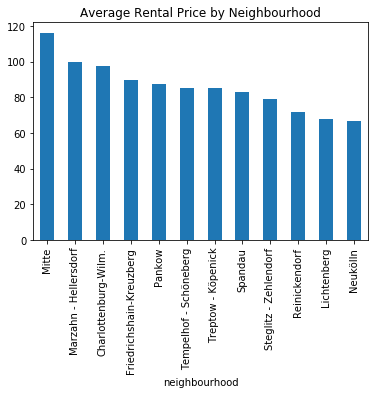

In [96]:
# Plot Series
avg_prices.plot(kind='bar')
plt.title('Average Rental Price by Neighbourhood')

The most expensive neighbourhood is Mitte, followed by Marzahn - Hellersdorf and Charlottenburg - Wilmersdorf.

*2. How have prices developed over time by neighbourhood, and what seems to be the trend in prices for each neighbourhood ?*

In [97]:
# Pivot and reduce dataframe in order to plot multi-line graph
prices_trends = prices_final.groupby(['date', 'neighbourhood']).mean()['price'].reset_index().pivot(index='date', columns='neighbourhood', values='price')

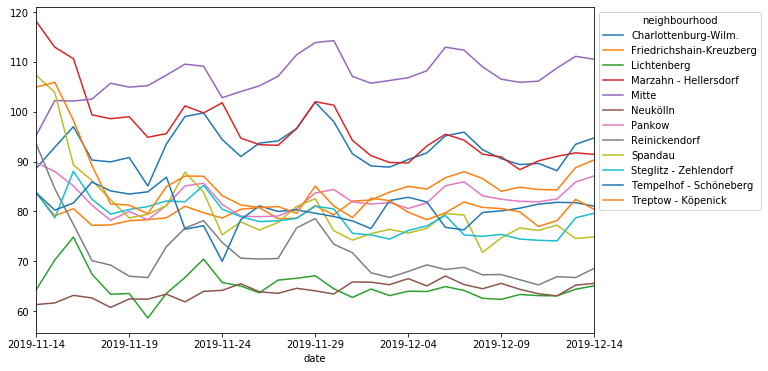

In [98]:
prices_trends.plot(figsize=(10,6)).legend(title='neighbourhood', bbox_to_anchor=(1, 1));

#### Result evaluation

A seasonality is perceptible. Prices tend to increase at the end of the week (Friday and over the weekend). This effect is mostly noticed in the most expensive neighbourhoods (where demand is at its highest). In the cheaper neighbourhoods (e.g., Lichtenberg), prices tend to stay flat.

Considering these trends, prices in Mitte are expected to stay in the same range of prices (between 100 and 120 dollars), possibly increase slightly, and follow the same seasonality, in the weeks to come.

### Analysis - Question 2

We will here investigate the distribution of offer across the city, in its relation to customer satisfaction. Which areas have high numbers of appartments put on airbnb rental ? Are these areas where visitors tend to be happy with their airbnb experience ? For this, we will map all available appartments, and segment them by rating on the one hand, district on the other hand.

**NOTE** : The following cells are commented because the map must be formatted manually and saved once.
The steps are retraced but they shouldn't be reproduced.

In [153]:
# Load an empty map
# map_ratings = KeplerGl(height=800)

User Guide: https://github.com/keplergl/kepler.gl/blob/master/docs/keplergl-jupyter/user-guide.md


In [154]:
# Format map of listings segmented by rating
# map_ratings.add_data(data=listings_map, name="data_1")
# map_ratings

KeplerGl(data={'data_1': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, …

In [155]:
# Save configuration
#map_ratings_config = map_ratings.config

In [156]:
# Show map with saved formatting
#map_ratings = KeplerGl(height=500, data={'data_1': listings_map}, config=map_ratings_config)
#map_ratings.save_to_html(file_name='AirBnbRatingsMap.html') 

User Guide: https://github.com/keplergl/kepler.gl/blob/master/docs/keplergl-jupyter/user-guide.md
Map saved to AirBnbRatingsMap.html!


In [158]:
# Load an empty map
#map_districts = KeplerGl(height=800)

User Guide: https://github.com/keplergl/kepler.gl/blob/master/docs/keplergl-jupyter/user-guide.md


In [159]:
# Format map of listings segmented by neighbourhood
#map_districts.add_data(data=listings_map, name="data_1")
#map_districts

KeplerGl(data={'data_1': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, …

In [160]:
# Save config
#map_districts_config = map_districts.config

In [161]:
# Show map with saved formatting
#map_districts = KeplerGl(height=500, data={'data_1': listings_map}, config=map_districts_config)
#map_districts.save_to_html(file_name='AirBnbDistrictsMap.html') 

User Guide: https://github.com/keplergl/kepler.gl/blob/master/docs/keplergl-jupyter/user-guide.md
Map saved to AirBnbDistrictsMap.html!


#### Result evaluation

Predictably, the offer of appartments follows a linear pattern in space, concentrated as it is at the heart of the city, spreading along its main axes and declining as it reaches the outskirts of the city.
The areas left empty correspond to parks, woods or lakes.

It's hard to distinguish a geographical pattern when it comes to ratings. The lowest scores (from 20 to 92) are generally distributed quite evently, although clusters can be identified at the very centre of the city, in the neighbourhood of Mitte, along a horizontal axis, and in peripheral areas.
The east of the city seems to be favoured, with the neighbourhoods of Neukölln (south-east), Pankow (north-east) and Friedrichshain (east) looking comparatively yellower, although it isn't clear that one can draw a decisive conclusion ouf of this.

The rating of a flat does not seem to be strongly influenced by the neighbourhood in wich this flat is located. It would be interesting to take other factors into consideration : the proximity of shops, the accessibility of public transportation, the noisiness of the surroundings, etc. A comparison with other cities would add great value to the analysis.

### Analysis - Question 3

We will now investigate the predictors of the ratings and identify which variable plays the strongest role in determining the final score given to an appartment. For this, we will use a random forest.

**NOTE** :
Having little experience with random forests, I followed in great part the method detailed in [this post](https://towardsdatascience.com/random-forest-in-python-24d0893d51c0), using some of the same variable names too.

In [120]:
score_pred_final.head()

,price,rating,host_seniority,has_wifi,pets_allowed,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,bed_type_Couch,bed_type_Futon,...,property_type_Lighthouse,property_type_Loft,property_type_Other,property_type_Pension (South Korea),property_type_Resort,property_type_Serviced apartment,property_type_Tiny house,property_type_Townhouse,property_type_Treehouse,property_type_Villa
0,21.0,82.0,4137,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,90.0,93.0,4073,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,125.0,99.0,3873,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
4,33.0,96.0,3864,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,70.0,93.0,3678,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Split dataset into features and labels

In [121]:
# Labels are the values we want to predict
labels = np.array(score_pred_final['rating'])

In [122]:
# Remove the labels from the features
features= score_pred_final.drop('rating', axis=1)

In [123]:
# Saving feature names for later use
feature_list = list(features.columns)

In [124]:
# Convert to numpy array
features = np.array(features)

#### Split dataset into training and testings sets

In [125]:
train_features, test_features, train_labels, test_labels = train_test_split(features, labels, test_size = 0.25, random_state = 42)

#### Instantiate and fit model

In [126]:
# Instantiate model with 1000 decision trees
rf = RandomForestRegressor(n_estimators = 1000, random_state = 42)

In [127]:
# Train the model on training data
rf.fit(train_features, train_labels);

#### Make predictions and evalute accuracy

In [128]:
# Use the forest's predict method on the test data
predictions = rf.predict(test_features)

In [129]:
# Calculate the absolute errors
errors = abs(predictions - test_labels)

In [130]:
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2))

Mean Absolute Error: 4.36


In [131]:
# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / test_labels)

In [132]:
# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Accuracy: 94.73 %.


#### Return and visualize feature importances

In [133]:
# Get numerical feature importances
importances = list(rf.feature_importances_)

In [134]:
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

In [135]:
# Sort the feature importances by most important first
feature_importances.sort(key=itemgetter(1), reverse=True)

In [136]:
# Keep only five most importances features
feature_importances = feature_importances[:5]

In [137]:
x_values = [x[0] for x in feature_importances]

In [138]:
y_values = [x[1] for x in feature_importances]

In [139]:
# Set the style
plt.style.use('fivethirtyeight')

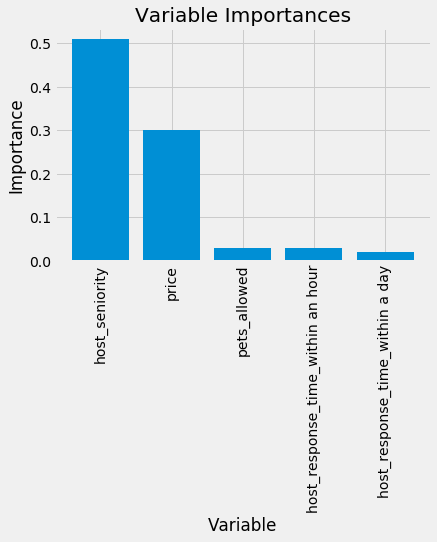

In [140]:
# Make a bar chart
plt.bar(list(range(len(x_values))), y_values, orientation = 'vertical')
# Tick labels for x axis
plt.xticks(list(range(len(x_values))), x_values, rotation='vertical')
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

The seniority of the host ranks first when it comes to influencing the final rating. This means that the longer a host has used the platform, the better they are able to anticipate and fulfill the customers' requirements and wishes.

Seniority is followed by price, meaning that satisfaction does not depend that much on the experience at and of the appartment itself and that a significant component of it is decided before the customer has even seen the appartment.

Pets and response time rank third and fourth, though far behind the two first variables.

The type of bed and the type of appartment play little to no role in the rating given. Visitors are not so much concerned with their comfort as with the ease of experience on the platform and relationship with the host.